In [62]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from scipy import stats

warnings.filterwarnings('ignore')



In [63]:
#import the dataset
df = pd.read_csv('C:\\Users\\Acer\\Downloads\\House Rent.csv')

In [64]:
df.head()

,Region,Charge for Service,Kind of Heating,Telekom Tv Promotion,Have a balcony?,Number of Pictures,Total Rent,House constructed Year,Number of Park Spaces,Firing Types,Has a kitchen?,House Condition,Pets Allowed?,Have a lift?,Type of Float,Number of rooms,Floor,Have a garden?,Heating Cost
0,Nordrhein_Westfalen,245.00,central_heating,ONE_YEAR_FREE,False,6,840.0,1965.0,1.0,oil,False,well_kept,NaN,False,ground_floor,4.0,1.0,True,NaN
1,Rheinland_Pfalz,134.00,self_contained_central_heating,ONE_YEAR_FREE,True,8,NaN,1871.0,2.0,gas,False,refurbished,no,False,ground_floor,3.0,NaN,False,NaN
2,Sachsen,255.00,floor_heating,ONE_YEAR_FREE,True,8,1300.0,2019.0,1.0,NaN,False,first_time_use,NaN,True,apartment,3.0,3.0,False,NaN
3,Sachsen,58.15,district_heating,ONE_YEAR_FREE,True,9,NaN,1964.0,NaN,district_heating,False,NaN,NaN,False,other,3.0,3.0,False,87.23
4,Bremen,138.00,self_contained_central_heating,NaN,True,19,903.0,1950.0,NaN,gas,False,refurbished,NaN,False,apartment,3.0,1.0,False,NaN


In [65]:
df.shape

(268850, 19)

In [66]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 268850 entries, 0 to 268849
Data columns (total 19 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Region                  268850 non-null  object 
 1   Charge for Service      261941 non-null  float64
 2   Kind of Heating         223994 non-null  object 
 3   Telekom Tv Promotion    236231 non-null  object 
 4   Have a balcony?         268850 non-null  bool   
 5   Number of Pictures      268850 non-null  int64  
 6   Total Rent              228333 non-null  float64
 7   House constructed Year  211805 non-null  float64
 8   Number of Park Spaces   93052 non-null   float64
 9   Firing Types            211886 non-null  object 
 10  Has a kitchen?          268850 non-null  bool   
 11  House Condition         200361 non-null  object 
 12  Pets Allowed?           154277 non-null  object 
 13  Have a lift?            268850 non-null  bool   
 14  Type of Float       

 Handling Missing Values


In [67]:
#Find the sum of the null values
df.isnull().sum()

Region                         0
Charge for Service          6909
Kind of Heating            44856
Telekom Tv Promotion       32619
Have a balcony?                0
Number of Pictures             0
Total Rent                 40517
House constructed Year     57045
Number of Park Spaces     175798
Firing Types               56964
Has a kitchen?                 0
House Condition            68489
Pets Allowed?             114573
Have a lift?                   0
Type of Float              36614
Number of rooms                0
Floor                      51309
Have a garden?                 0
Heating Cost              183332
dtype: int64

In [68]:
categorical_columns_with_null = df.columns[df.isnull().any()].tolist()
# Fill missing values for categorical columns with mode
df[categorical_columns_with_null] = df[categorical_columns_with_null].fillna(df[categorical_columns_with_null].mode().iloc[0])

df.isnull().sum()


Region                    0
Charge for Service        0
Kind of Heating           0
Telekom Tv Promotion      0
Have a balcony?           0
Number of Pictures        0
Total Rent                0
House constructed Year    0
Number of Park Spaces     0
Firing Types              0
Has a kitchen?            0
House Condition           0
Pets Allowed?             0
Have a lift?              0
Type of Float             0
Number of rooms           0
Floor                     0
Have a garden?            0
Heating Cost              0
dtype: int64

In [69]:
#as we see the shape is same we only fill null values with mode
df.shape

(268850, 19)

                                          Changing Data Types

In [70]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 268850 entries, 0 to 268849
Data columns (total 19 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Region                  268850 non-null  object 
 1   Charge for Service      268850 non-null  float64
 2   Kind of Heating         268850 non-null  object 
 3   Telekom Tv Promotion    268850 non-null  object 
 4   Have a balcony?         268850 non-null  bool   
 5   Number of Pictures      268850 non-null  int64  
 6   Total Rent              268850 non-null  float64
 7   House constructed Year  268850 non-null  float64
 8   Number of Park Spaces   268850 non-null  float64
 9   Firing Types            268850 non-null  object 
 10  Has a kitchen?          268850 non-null  bool   
 11  House Condition         268850 non-null  object 
 12  Pets Allowed?           268850 non-null  object 
 13  Have a lift?            268850 non-null  bool   
 14  Type of Float       

In [71]:
#some of the datas have wrong type,let's change it
columns_to_convert = ['House constructed Year', 'Number of Park Spaces', 'Number of rooms', 'Floor']
df[columns_to_convert] = df[columns_to_convert].astype('int64')

                                           Correlation Matrix

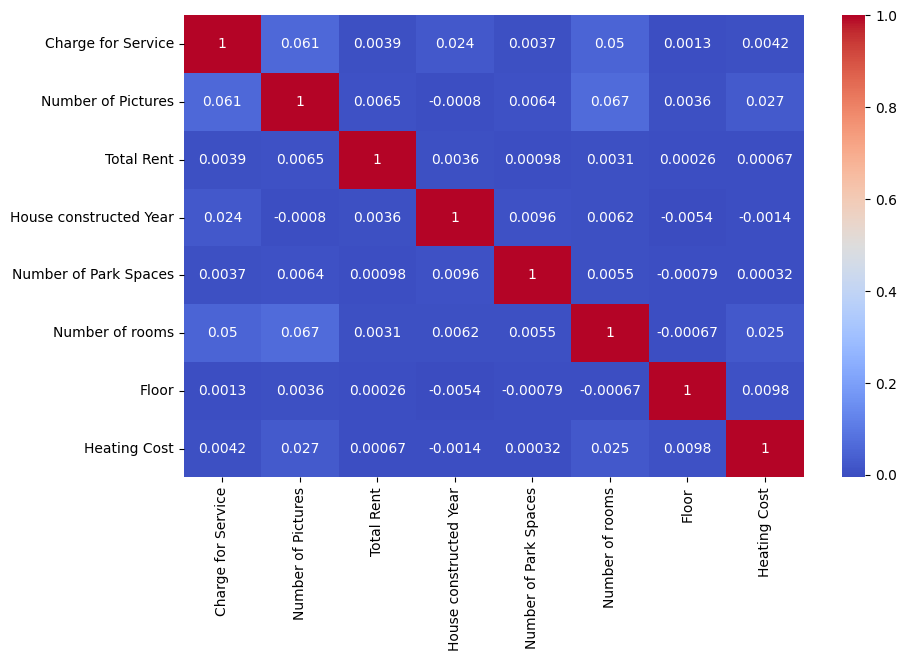

In [72]:
numeric_columns = df.select_dtypes(include=['int','float']).columns
df_numeric = df[numeric_columns]
corr_mat = df_numeric.corr()
plt.figure(figsize=(10,6))
sns.heatmap(corr_mat,cmap='coolwarm',annot=True);

The shapes in the heatmap are squares, and the colors represent the strength and direction of the correlation between each pair of variables. Red squares indicate a positive correlation, blue squares indicate a negative correlation, and white squares indicate no correlation.

------------------------------------------------------------------------------------------------------------------------------------------------------------

                                     Outlier Detection and Removal

<Axes: ylabel='Number of rooms'>

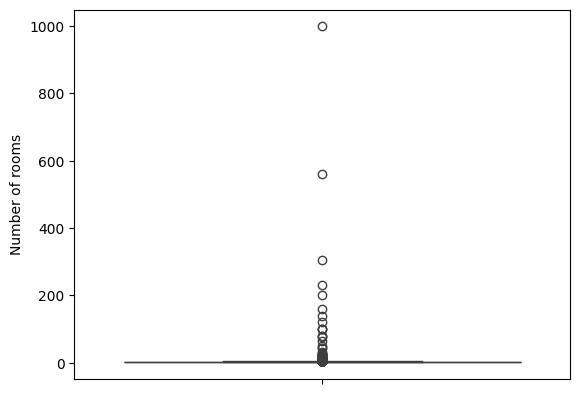

In [73]:
#Outlier Detection and Removal for 'Number of rooms'
sns.boxplot(df['Number of rooms'])

In [74]:
## Outlier Detection
data = df['Number of rooms']
sort_data = np.sort(data) 
sort_data

array([  1,   1,   1, ..., 305, 560, 999], dtype=int64)

In [75]:
q1 = np.nanpercentile(data, 25, method='midpoint', ) 
q2 = np.nanpercentile(data, 50, method='midpoint') 
q3 = np.nanpercentile(data, 75, method='midpoint') 

IQR = q3 - q1 
q3

3.0

In [76]:
lower_limit = q1 - 1.5*(q3 - q1)
upper_limit = q3 + 1.5*(q3 - q1)
print(lower_limit)
print(upper_limit)

lower_limitoutliers = sort_data[sort_data < lower_limit]
upper_limitoutliers = sort_data[sort_data > upper_limit]

0.5
4.5



This markdown provides a step-by-step explanation of the outlier detection and removal process for both 'Number of rooms' and 'Number of Park Spaces'

In [77]:
upper_limitoutliers

array([  5,   5,   5, ..., 305, 560, 999], dtype=int64)

In [78]:
lower_limitoutliers

array([], dtype=int64)

In [79]:
sort_data[sort_data < lower_limit] = lower_limit
sort_data[sort_data > upper_limit] = upper_limit

In [80]:
# Outlier Removal
data_1 = df[df['Number of rooms']<4.5]

<Axes: ylabel='Number of rooms'>

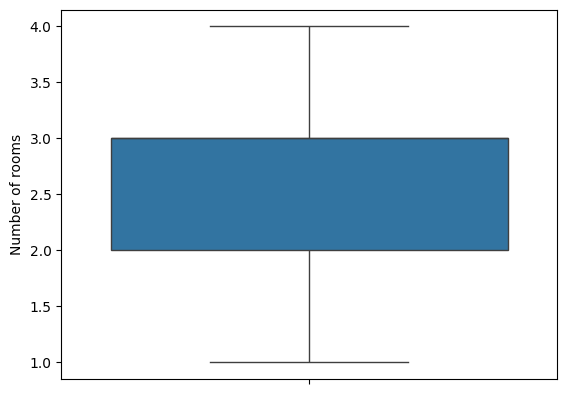

In [81]:
#Let's see the result
sns.boxplot(data_1['Number of rooms'])


In [82]:
data_2 = df['Number of Park Spaces']
sort_data = np.sort(data_2) 
sort_data

array([   0,    0,    0, ...,  320,  320, 2241], dtype=int64)

In [83]:
q1 = np.nanpercentile(data_2, 25, method='midpoint', ) 
q2 = np.nanpercentile(data_2, 50, method='midpoint') 
q3 = np.nanpercentile(data_2, 75, method='midpoint') 

IQR = q3 - q1 
q3

1.0

In [84]:
lower_limit = q1 - 1.5*(q3 - q1)
upper_limit = q3 + 1.5*(q3 - q1)
print(lower_limit)
print(upper_limit)

lower_limitoutliers = sort_data[sort_data < lower_limit]
upper_limitoutliers = sort_data[sort_data > upper_limit]

1.0
1.0


<Axes: ylabel='Number of Park Spaces'>

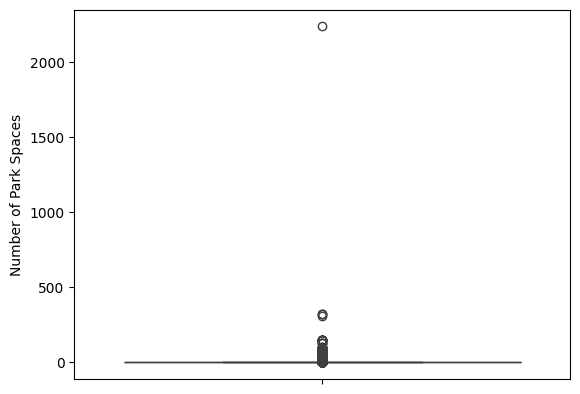

In [85]:
sns.boxplot(df['Number of Park Spaces'])


In [86]:
# Outlier Removal
data = df[df['Number of Park Spaces']<2]

<Axes: ylabel='Number of Park Spaces'>

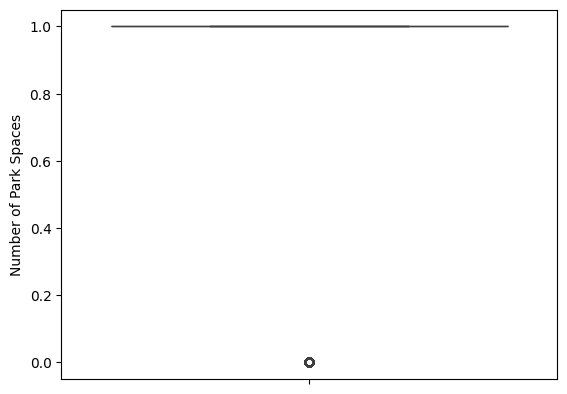

In [87]:
sns.boxplot(data['Number of Park Spaces'])


                                      Analysis and Visualization

In [88]:
region_df = df['Region'].value_counts()
region_df

Region
Nordrhein_Westfalen       62863
Sachsen                   58154
Bayern                    21609
Sachsen_Anhalt            20124
Hessen                    17845
Niedersachsen             16593
Baden_Württemberg         16091
Berlin                    10406
Thüringen                  8388
Rheinland_Pfalz            8368
Brandenburg                6954
Schleswig_Holstein         6668
Mecklenburg_Vorpommern     6634
Hamburg                    3759
Bremen                     2965
Saarland                   1429
Name: count, dtype: int64

In [89]:
#Number of House in Each City which is Available for Rent
import plotly.express as px
fig = px.bar(region_df, x= region_df.index,y=region_df.values,color=region_df.index,
            title='Number of House in Each Region which is Available for Rent', text=region_df.values)
fig.update_traces(width=0.3)
fig.update_layout(
xaxis_title="Region",
    yaxis_title="Count",
    font = dict(size=17))
fig.show()

In [90]:
# Scatter Plot of House Rents vs House Condition
fig = px.scatter(df,x='House Condition', y= 'Total Rent',color='Have a balcony?',
                 hover_data=['Total Rent'])
fig.update_layout(title='House Rents vs House Condition',
                  yaxis_zeroline=False, xaxis_zeroline=False)
fig.update_yaxes(range=[0, 40000])
fig.show()

In [91]:
avg_charge_df = df.groupby('Region')['Charge for Service'].mean().sort_values(ascending=False).round(2)

In [92]:
#Average charge per region for service

fig = px.bar(avg_charge_df,x=avg_charge_df.index,y=avg_charge_df.values,
            color=avg_charge_df.index,title='Average charge per region for service',
            text=avg_charge_df.values)
fig.update_traces(width=0.3)
fig.update_layout(
    xaxis_title="Region",
    yaxis_title="Average Charge",
    font = dict(size=17))

fig.show()

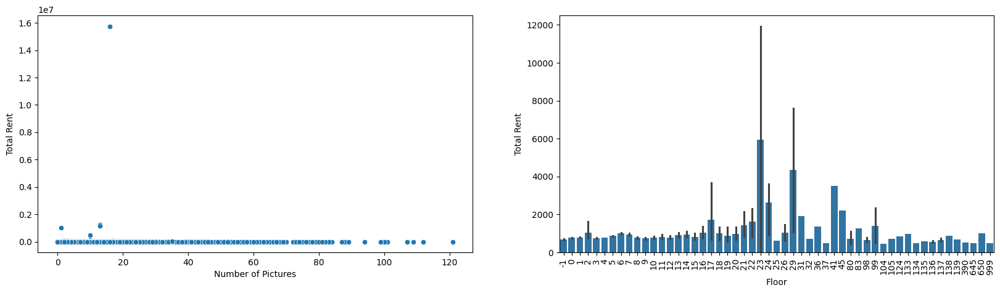

In [93]:
# Subplots of Scatterplot and Barplot
fig,axes = plt.subplots(1,2,figsize =(20,5))
sns.scatterplot(x='Number of Pictures',y='Total Rent',data=df,ax=axes[0])
sns.barplot(x='Floor',y='Total Rent',data=df,ax=axes[1])
plt.xticks(rotation=90);

These subplots display the relationship between the number of pictures and total rent, and between the floor and total rent using scatterplot and barplot, respectively.

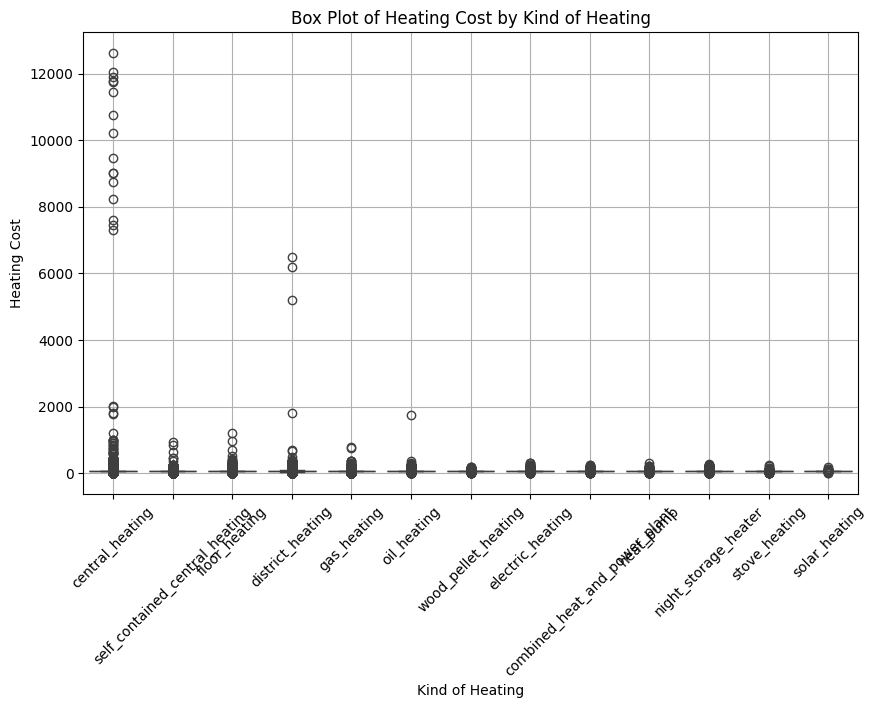

In [94]:
## Boxplot of 'Heating Cost' by 'Kind of Heating'
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'Heating Cost' and 'Kind of Heating' are columns in your DataFrame df
plt.figure(figsize=(10, 6))
sns.boxplot(x='Kind of Heating', y='Heating Cost', data=df)
plt.xlabel('Kind of Heating')
plt.ylabel('Heating Cost')
plt.title('Box Plot of Heating Cost by Kind of Heating')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability if needed
plt.grid(True)
plt.show()


This boxplot visualizes the distribution of heating cost across different types of heating methods.

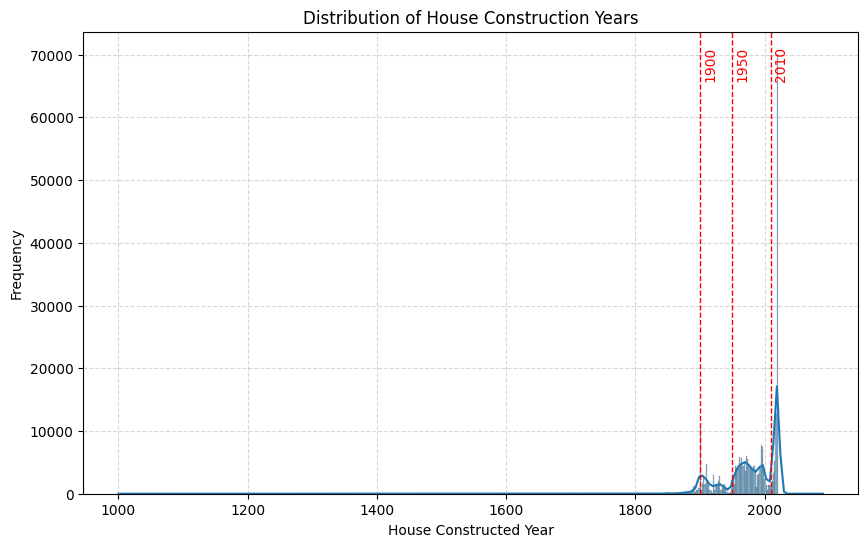

In [95]:
# Histogram of 'House constructed Year' with Important Years Highlighted
fig, ax = plt.subplots(figsize=(10, 6))

# Create a histogram with KDE (Kernel Density Estimation) plot
sns.histplot(data=df, x='House constructed Year', kde=True, ax=ax)

important_years=[1900,1950,2010]
for i in important_years:
    ax.axvline(x=i,color='red',linestyle='--',linewidth =1)
    ax.text(i +5,ax.get_ylim()[1]*0.9,str(i),color='red',rotation=90)
plt.xlabel('House Constructed Year')
plt.ylabel('Frequency')
plt.title('Distribution of House Construction Years')

# Customize grid and ticks
ax.grid(True, linestyle='--', alpha=0.5)


plt.show()

This histogram shows the distribution of house construction years, with important years (e.g., 1900, 1950, 2010) highlighted.

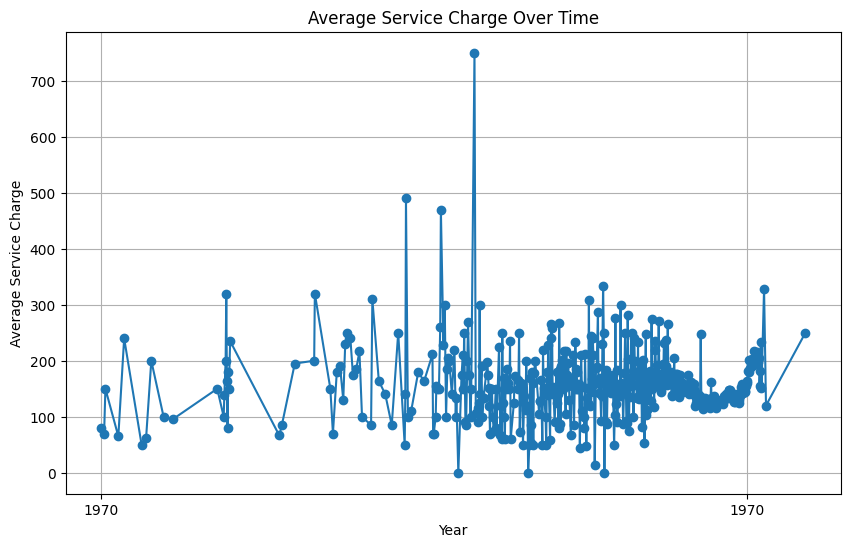

In [96]:
# Line Plot of 'Average Service Charge' Over Time
df['House constructed Year'] = pd.to_datetime(df['House constructed Year'])
avg_charge = df.groupby('House constructed Year')['Charge for Service'].mean()
plt.figure(figsize=(10, 6))
plt.plot(avg_charge.index,avg_charge.values,marker='o',linestyle='-')
plt.xlabel('Year')
plt.ylabel('Average Service Charge')
plt.title('Average Service Charge Over Time')
plt.grid(True)
plt.show()


This line plot illustrates the trend of average service charge over time based on the year of house construction.

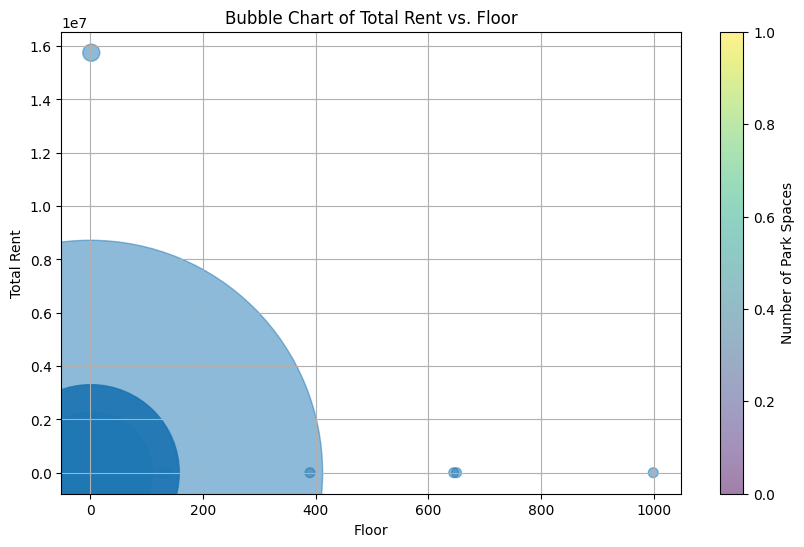

In [97]:
# Bubble Chart of 'Total Rent' vs. 'Floor'



#df = df[~df['Floor'].isin([645, 650, 999, 104])]
#For delete values like 645, 650, 999, or 104 might be 
#outliers if they don't correspond to typical floor numbers.

bubble_size = df['Number of Park Spaces'] * 50
plt.figure(figsize=(10,6))
plt.scatter(df['Floor'], df['Total Rent'], s=bubble_size, alpha=0.5)
plt.xlabel('Floor')
plt.ylabel('Total Rent')
plt.title('Bubble Chart of Total Rent vs. Floor')

plt.colorbar(label='Number of Park Spaces')

plt.grid(True)
plt.show()

This bubble chart visualizes the relationship between total rent and floor, with the size of the bubbles representing the number of park spaces.

In [98]:

cleaned_df = df.copy()

# Split the 'Firing Types' column by colons and expand it into separate columns
firing_types_split = df['Firing Types'].str.split(':', expand=True)

unique_firing_types = pd.concat([firing_types_split[col]
 for col in firing_types_split.columns]).unique()

# Convert the Series of unique firing types into a DataFrame with a single column
unique_firing_types_df = pd.DataFrame(unique_firing_types, columns=['Firing Type'])

print(unique_firing_types_df)


                                    Firing Type
0                                           oil
1                                           gas
2                              district_heating
3                                   electricity
4                                pellet_heating
5                             natural_gas_light
6          combined_heat_and_power_fossil_fuels
7                        steam_district_heating
8                             natural_gas_heavy
9                                 solar_heating
10                 environmental_thermal_energy
11                                local_heating
12                                   geothermal
13  combined_heat_and_power_regenerative_energy
14                                  heat_supply
15                                   liquid_gas
16                                         wood
17                                 hydro_energy
18     combined_heat_and_power_renewable_energy
19                                      

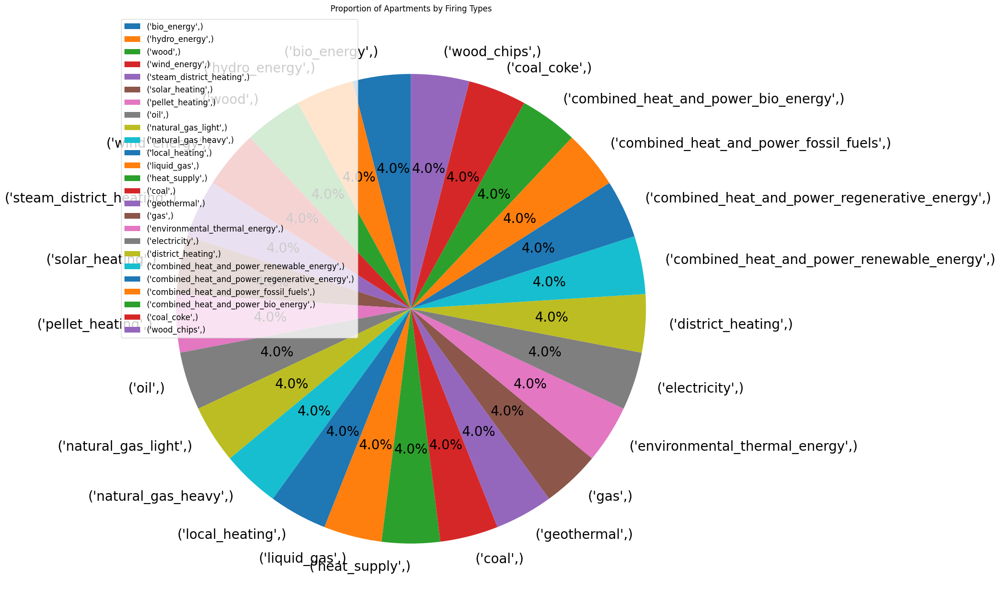

In [99]:
## Pie Chart of Proportion of Apartments by Firing Types
firing_types_counts = unique_firing_types_df.value_counts()

# Plotting
plt.figure(figsize=(18, 16))
plt.pie(firing_types_counts ,labels = firing_types_counts.index,autopct='%1.1f%%', startangle=90,textprops={'fontsize' :20})
plt.title('Proportion of Apartments by Firing Types')
plt.legend( fontsize="12",loc='upper left')
plt.show()

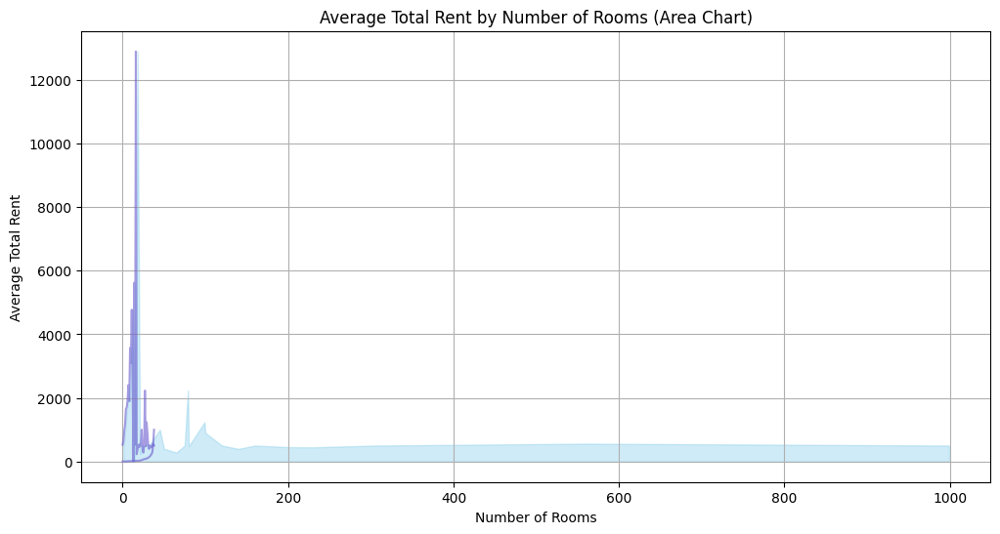

In [100]:
# Area Chart of Average Total Rent by Number of Rooms
rent_by_rooms = df.groupby('Number of rooms')['Total Rent'].mean().reset_index()
rent_by_rooms = rent_by_rooms.sort_index()
plt.figure(figsize=(12,6))
plt.fill_between(rent_by_rooms['Number of rooms'], rent_by_rooms['Total Rent'], color='skyblue', alpha=0.4)
plt.plot(rent_by_rooms.index,rent_by_rooms.values,color='Slateblue',alpha=0.6)
plt.xlabel('Number of Rooms')
plt.ylabel('Average Total Rent')
plt.title('Average Total Rent by Number of Rooms (Area Chart)')
plt.grid(True)
plt.show()

In [101]:
avg_rent_df = df.groupby('Region')['Total Rent'].mean().sort_values(ascending=False)

<Axes: >

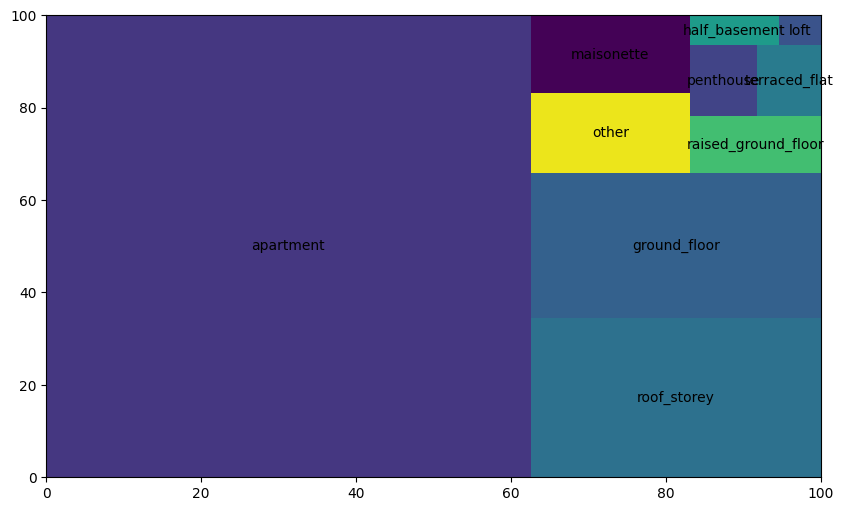

In [102]:
# Treemap of Proportion of Apartments by Firing Types

import squarify
apartments_by_type = df['Type of Float'].value_counts()
plt.figure(figsize=(10, 6))
squarify.plot(sizes=apartments_by_type.values,label=apartments_by_type.index)

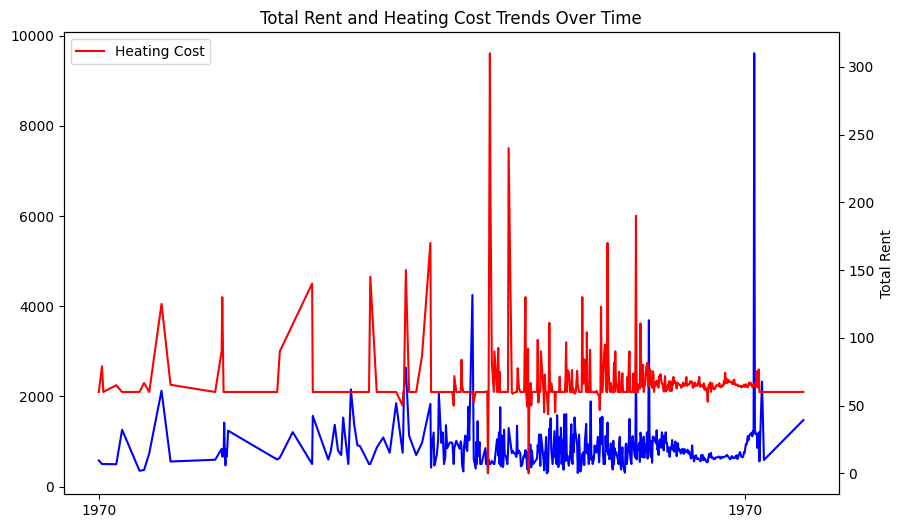

In [103]:
# Dual-axis Line Plot of Total Rent and Heating Cost Trends Over Time
df_dual = df.groupby('House constructed Year')[['Total Rent', 'Heating Cost']].mean()

plt.figure(figsize=(10,6))
plt.plot(df_dual.index,df_dual['Total Rent'],color='blue', label='Total Rent')
plt.twinx()
plt.plot(df_dual.index,df_dual['Heating Cost'],color='red',label='Heating Cost')
plt.xlabel('Date')
plt.ylabel('Total Rent')
plt.title('Total Rent and Heating Cost Trends Over Time')
plt.legend(loc='upper left')

plt.show()

This dual-axis line plot illustrates the trends of total rent and heating cost over time based on the year of house construction.